# International Trade Network Analysis: Understanding Global Economic Interactions

International trade forms the backbone of the global economy, facilitating the exchange of goods, services, and resources between countries. The intricate web of trade relationships not only impacts national economies but also influences global economic stability and growth. Understanding these relationships is crucial for policymakers, economists, and business leaders alike. In this context, network analysis provides a powerful tool to unravel the complexities of international trade.

International trade networks are dynamic and complex. By analyzing these networks, we can uncover patterns, trends, and key players that shape global trade. Through centrality measures we can identify countries that play a central role in the trade network. These central countries often act as major hubs, influencing trade flows and economic policies.

In [5]:
from utils_single_2 import *

In [6]:
with open('countries.json', 'r') as file:
    data = json.load(file)

Probably due to the apostrophe, the scraping for Cote d'Ivoire fails, and there is no entry in the dataset, although the country being mentioned as an Import and Export partner by several countries, hence we insert the country manually taking its data from its [dataset web-page](https://www.cia.gov/the-world-factbook/countries/cote-divoire/summaries).

In [7]:
data['Cote d\'Ivoire'] = {
    "Economy: Real GDP (purchasing power parity)": "$202.758 billion (2023 est.)$190.319 billion (2022 est.)$179.178 billion (2021 est.)",
    "Economy: GDP - composition, by end use - exports of goods and services": "30.8%",
    "Economy: GDP - composition, by end use - imports of goods and services": "-30.1% (2017 est.)",
    "Economy: Exports": "$17.211 billion (2022 est.)$16.23 billion (2021 est.)$13.232 billion (2020 est.)",
    "Economy: Exports - partners": "Switzerland 9%, Mali 8%, Netherlands 8%, US 6%, France 5% (2022)",
    "Economy: Exports - commodities": "cocoa beans, gold, rubber, refined petroleum, cocoa paste (2022)",
    "Economy: Imports": "$19.948 billion (2022 est.)$16.191 billion (2021 est.)$12.66 billion (2020 est.)",
    "Economy: Imports - partners": "China 18%, Nigeria 11%, France 8%, India 5%, Belgium 4% (2022)",
    "Economy: Imports - commodities": "crude petroleum, refined petroleum, ships, rice, fish (2022)",
    "Geography: Geographic coordinates": "8 00 N, 5 00 W",
    "Government: Government type": "presidential republic"    
}

# 1. Network Creation
## Data Preprocessing

In [8]:
# We retrieve only the countries that have all the followings informations
key_mapping = {
        "Economy: Real GDP (purchasing power parity)": "GDP",
        "Economy: GDP - composition, by end use - exports of goods and services": "GDP% Exports",
        "Economy: GDP - composition, by end use - imports of goods and services": "GDP% Imports",
        "Economy: Exports": "Exports $",
        "Economy: Exports - partners": "Export Partners",
        "Economy: Exports - commodities": "Export Commodities",
        "Economy: Imports": "Imports $",
        "Economy: Imports - partners": "Import Partners",
        "Economy: Imports - commodities": "Import Commodities",
        "Geography: Geographic coordinates": "Coordinates",
        "Government: Government type": 'Government type' 
    }
old_keys = list(key_mapping.keys())

# And map some country names for convenience
country_mapping = {
    'UK': 'United Kingdom',
    'US': 'United States',
    'UAE': 'United Arab Emirates',
    'Gambia, The': 'Gambia',
    'Turkey (Turkiye)': 'Turkey',
    'Congo, Democratic Republic of the': 'Congo',
    'Democratic Republic of the Congo': 'Congo',
    'Congo, Republic of the': 'Congo',
    'Republic of the Congo': 'Congo',
    'Korea, South': 'South Korea',
    'Korea, North': 'North Korea',
    'Cost Rica': 'Costa Rica',
    'NZ': 'New Zealand',
    'Micronesia, Federated States of': 'Micronesia',
    'Bahamas, The': 'Bahamas'
}

In [9]:
# Filter the data
filtered_data = {}
missing_data = []

for country, info in data.items():
    # Check if the country is France and adjust the key accordingly
    if country == 'France':
        required_keys = set(old_keys)
        required_keys.remove("Geography: Geographic coordinates")
        required_keys.add("Geography: Geographic coordinates - metropolitan France")
    else:
        required_keys = set(old_keys)

    # Check if all required keys are present
    if required_keys <= set(info.keys()):
        filtered_data[country] = info
    else:
        missing_data.append(country)

data = filtered_data

print("\nCountries missing required data:")
print("\n".join('\t' + country for country in missing_data))


Countries missing required data:
	Akrotiri
	Andorra
	Anguilla
	Antarctica
	Ashmore and Cartier Islands
	Baker Island
	Bouvet Island
	British Indian Ocean Territory
	Christmas Island
	Clipperton Island
	Cocos (Keeling) Islands
	Cook Islands
	Coral Sea Islands
	Dhekelia
	Falkland Islands (Islas Malvinas)
	Faroe Islands
	French Southern and Antarctic Lands
	Gaza Strip
	Gibraltar
	Guernsey
	Heard Island and McDonald Islands
	Holy See (Vatican City)
	Howland Island
	Isle of Man
	Jan Mayen
	Jarvis Island
	Jersey
	Johnston Atoll
	Kingman Reef
	Kiribati
	Liechtenstein
	Midway Islands
	Monaco
	Navassa Island
	Niue
	Norfolk Island
	Palmyra Atoll
	Paracel Islands
	Pitcairn Islands
	Saint Barthelemy
	Saint Helena, Ascension, and Tristan da Cunha
	Saint Martin
	Saint Pierre and Miquelon
	Sint Maarten
	Spratly Islands
	Svalbard
	Tokelau
	Wake Island
	Wallis and Futuna
	West Bank
	World


In [10]:
# Loop over each country and its associated data in the 'data' dictionary.
for country, country_data in data.items():
    # Adjust the keys specifically for France
    updated_country_data = {}
    for key, value in country_data.items():
        if country == "France" and key == "Geography: Geographic coordinates - metropolitan France":
            updated_country_data["Coordinates"] = value
        elif key in old_keys:
            new_key = key_mapping.get(key, key)
            updated_country_data[new_key] = value
    
    data[country] = updated_country_data

In [11]:
# Loop over each country's data to clean up percentage values by removing '%' and any text after a space and parentheses.
for country_data in data.values():
    for key, value in country_data.items():
        # Extract the part of the value before the first occurrence of ' (' and remove the '%' sign.
        tempval = value.split(' (')[0]
        # Update the value in the dictionary after stripping the '%' sign.
        country_data[key] = tempval.strip('%')

In [12]:
# Loop over each country's data to process export and import partners.
for country_data in data.values():
    # Process the 'Export Partners' string, splitting it into individual partner entries.
    export_partners_str = country_data['Export Partners']
    export_partners = export_partners_str.split(', ')

    # Create a new dictionary to hold the export partners and their associated percentages.
    export_partner_associations = {}

    # Loop over each partner string to separate the partner's name and the percentage.
    for partner_str in export_partners:
        last_space_index = partner_str.rfind(' ')
        partner = partner_str[:last_space_index]  # Extract the partner's name.
        percentage = partner_str[last_space_index+1:]  # Extract the percentage.
        percentage = percentage.replace(',', '')  # Remove commas from the percentage.
        percentage = percentage.replace('%', '')  # Remove the '%' sign.

        # Add the partner and percentage to the 'export_partner_associations' dictionary.
        export_partner_associations[partner] = percentage

    # Update the 'Export Partners' entry in the country's data with the new dictionary.
    country_data['Export Partners'] = export_partner_associations

    # Similar process for 'Import Partners'.
    import_partners_str = country_data['Import Partners']
    import_partners = import_partners_str.split(', ')

    # Create a new dictionary to hold the import partners and their associated percentages.
    import_partner_associations = {}

    # Loop over each partner string to separate the partner's name and the percentage.
    for partner_str in import_partners:
        last_space_index = partner_str.rfind(' ')
        partner = partner_str[:last_space_index]  # Extract the partner's name.
        percentage = partner_str[last_space_index+1:]  # Extract the percentage.
        percentage = percentage.replace(',', '')  # Remove commas from the percentage.
        percentage = percentage.replace('%', '')  # Remove the '%' sign.

        # Add the partner and percentage to the 'import_partner_associations' dictionary.
        import_partner_associations[partner] = percentage

    # Update the 'Import Partners' entry in the country's data with the new dictionary.
    country_data['Import Partners'] = import_partner_associations

In [13]:
# Loop over each country's data to convert coordinates into decimal format.
for country_data in data.values():
    coordinates = country_data.get("Coordinates")
    if coordinates:
        # Convert the coordinates to decimal format using the 'convert_to_decimal' function.
        country_data["Coordinates"] = convert_to_decimal(coordinates)

In [14]:
government_types = list(set([data[country]['Government type'] for country in data]))

print(f'There are {len(government_types)} different kind of government in our dataset.')

There are 50 different kind of government in our dataset.


We are now going to reduce our taxonomy by merging similar government types into broader macrocategories.

In [15]:
government_type_mapping = {
    'presidential republic': 'Presidential Republic',
    'Republic of Cyprus - presidential republic; self-declared "Turkish Republic of Northern Cyprus"': 'Presidential Republic',
    'presidential republic in free association with the US': 'Presidential Republic',
    
    'constitutional federal republic': 'Federal Republic',
    'federal republic in free association with the US': 'Federal Republic',
    'federal republic': 'Federal Republic',
    
    'federal presidential republic': 'Federal Presidential Republic',
    
    'federal parliamentary democracy': 'Federal Parliamentary Republic',
    'federal parliamentary republic': 'Federal Parliamentary Republic',

    'parliamentary democracy under a constitutional monarchy; a Commonwealth realm': 'Constitutional Monarchy',
    'federal parliamentary democracy under a constitutional monarchy; a Commonwealth realm': 'Constitutional Monarchy',
    'federal parliamentary democracy under a constitutional monarchy': 'Constitutional Monarchy',
    'parliamentary constitutional monarchy': 'Constitutional Monarchy',
    'parliamentary republic; a Commonwealth realm': 'Constitutional Monarchy',
    'parliamentary democracy; part of the Kingdom of the Netherlands': 'Constitutional Monarchy',
    'Overseas Territory of the UK with limited self-government; parliamentary democracy': 'Constitutional Monarchy',
    'parliamentary constitutional monarchy; a Commonwealth realm': 'Constitutional Monarchy',
    'parliamentary democracy; self-governing overseas territory of the UK': 'Constitutional Monarchy',
    'constitutional monarchy': 'Constitutional Monarchy',
    'federal parliamentary constitutional monarchy': 'Constitutional Monarchy',
    'parliamentary constitutional monarchy; part of the Kingdom of the Netherlands': 'Constitutional Monarchy',

    'unincorporated organized territory of the US with local self-government; republican form of territorial government with separate executive, legislative, and judicial branches': 'Territorial Government',
    'unincorporated, unorganized Territory of the US with local self-government; republican form of territorial government with separate executive, legislative, and judicial branches': 'Territorial Government',
    'a commonwealth in political union with and under the sovereignty of the US; republican form of government with separate executive, legislative, and judicial branches': 'Territorial Government',
    'unincorporated organized territory of the US with local self-government; republican form of territorial government with separate executive, legislative, and judicial branches; note - reference Puerto Rican Federal Relations Act, 2 March 1917, as amended by Public Law 600, 3 July 1950': 'Territorial Government',

    'presidential republic; authoritarian': 'Authoritarian Republic',
    'presidential republic; highly authoritarian': 'Authoritarian Republic',
    'presidential republic; highly authoritarian regime': 'Authoritarian Republic',

    'executive-led limited democracy; a special administrative region of the People\'s Republic of China': 'Limited Democracy',
    'presidential limited democracy; a special administrative region of the People\'s Republic of China': 'Limited Democracy',

    'presidential republic in name, although in fact a dictatorship': 'Dictatorship',
    'dictatorship, single-party state; official state ideology of "Juche" or "national self-reliance"': 'Dictatorship',

    'parliamentary republic': 'Parliamentary Republic',
    'unitary parliamentary republic': 'Parliamentary Republic',
    'parliamentary democracy; note - constitutional changes adopted in December 2015 transformed the government to a parliamentary system': 'Parliamentary Republic',
    'parliamentary democracy': 'Parliamentary Republic',

    'theocratic; the United States does not recognize the Taliban Government': 'Theocratic',
    'theocratic republic': 'Theocratic',

    'communist state': 'Communist State',
    'communist party-led state': 'Communist State',

    'mixed presidential-parliamentary system in free association with the US': 'Mixed System',

    'absolute monarchy or sultanate': 'Absolute Monarchy',
    'absolute monarchy': 'Absolute Monarchy',

    'federation of monarchies': 'Federation of Monarchies',
    
    'semi-presidential republic': 'Semi-Presidential Republic',
    'semi-presidential federation': 'Semi-Presidential Federation',
    
    'military regime': 'Military Regime',

    'in transition': 'Transitional Government'
}

In [16]:
for country in data:
    current_type = data[country].get("Government type").replace('\xa0', ' ')
    if current_type in government_type_mapping:
        data[country]["Government type"] = government_type_mapping[current_type]
    else:
        print(f"Warning: Government type '{current_type}' for country '{country}' not found in mapping.")

government_types = list(set([attributes["Government type"] for attributes in data.values()]))
print(f'There are {len(government_types)} different kinds of government in our dataset after the update.')

There are 19 different kinds of government in our dataset after the update.


### Dataframes Creation

In [17]:
# Create exports dataframe and node attributes
trade_df, node_attributes = create_df(data, country_mapping)
trade_df

,source,target
0,Afghanistan,United Arab Emirates
1,Afghanistan,Pakistan
2,Afghanistan,India
3,Afghanistan,China
4,United Arab Emirates,Afghanistan
...,...,...
1755,China,Cote d'Ivoire
1756,Nigeria,Cote d'Ivoire
1757,France,Cote d'Ivoire
1758,India,Cote d'Ivoire


## Network

In [18]:
G = create_graph(trade_df, node_attributes)

# Check number of nodes and edges
print(f"Number of nodes in the graph: {G.number_of_nodes()}")
print(f"Number of edges in graph: {G.number_of_edges()}")

# Print attributes of a sample node in the graph
sample_node = list(G.nodes())[0]  # Get the first node
print(f"\nSample node attributes in the graph ({sample_node}):")
print("\n".join(f'\t{key}: {value}' for key, value in G.nodes[sample_node].items()))

Number of nodes in the graph: 207
Number of edges in graph: 1760

Sample node attributes in the graph (Afghanistan):
	Government Type: Theocratic
	GDP: 0.060802
	Exports $: 0.0014759999999999999
	Exports GDP%: 6.7
	Imports $: 0.006983
	Imports GDP%: -47.6
	Export Commodities: ['gold', 'figs', 'grapes', 'cotton', 'fruits and nuts', 'coal']
	Import Commodities: ['wheat flours', 'broadcasting equipment', 'refined petroleum', 'rolled tobacco', 'aircraft parts', 'synthetic fabrics']
	x: 65.0
	y: 33.0


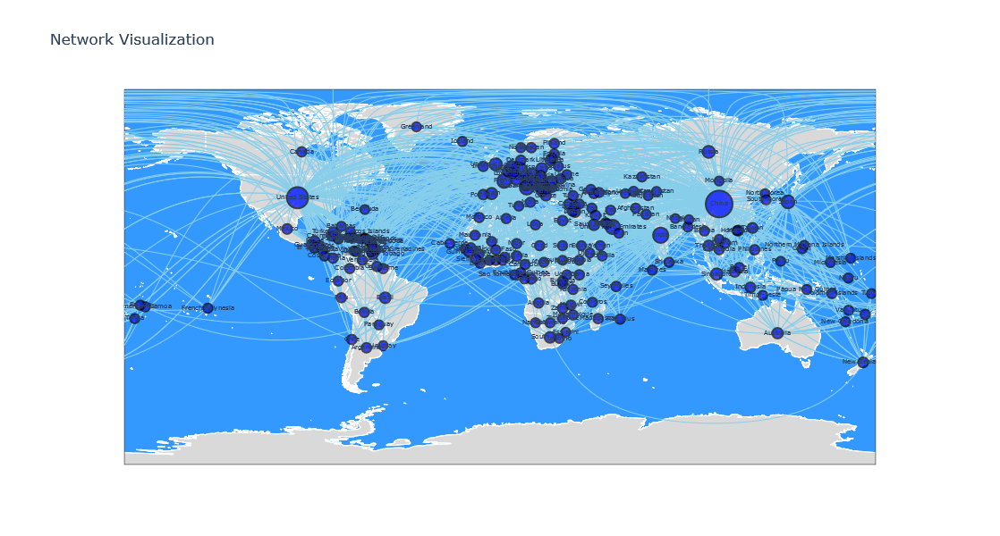

In [19]:
degree_centrality = nx.degree_centrality(G)
plot_network_on_world_map(G, degree_centrality, title='Network Visualization')

# 2. Measures

## Degree Centrality - How does the government type influence the country import and exports politics?

Degree centrality measures the number of direct connections a node has. In the context of a trade network, it indicates the number of trade partners a country has. A higher degree centrality means that a country has more direct trade relationships, suggesting its central role in the network.

In [20]:
top_countries, worst_countries = histograms(degree_centrality, type='Degree Centrality', n=15)

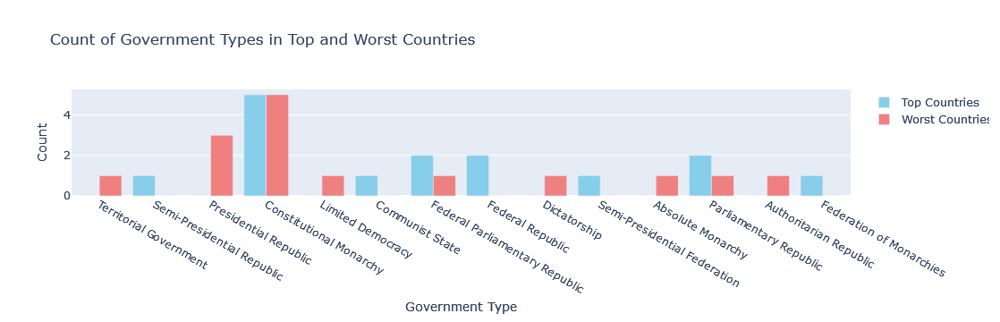

Top Countries
	Country                   | Government Type                         
	-----------------------------------------------------------------
	China                     | Communist State                         
	United States             | Federal Republic                        
	Germany                   | Federal Parliamentary Republic          
	India                     | Federal Parliamentary Republic          
	United Arab Emirates      | Federation of Monarchies                
	Italy                     | Parliamentary Republic                  
	France                    | Semi-Presidential Republic              
	Japan                     | Constitutional Monarchy                 
	Netherlands               | Constitutional Monarchy                 
	United Kingdom            | Constitutional Monarchy                 
	Russia                    | Semi-Presidential Federation            
	Singapore                 | Parliamentary Republic                  
	Spain   

In [21]:
from collections import Counter

# Count government types for top and worst countries
top_country_gov_types = [node_attributes[country]["Government Type"] for country in top_countries]
worst_country_gov_types = [node_attributes[country]["Government Type"] for country in worst_countries]

# Get counts of each government type
top_gov_type_counts = Counter(top_country_gov_types)
worst_gov_type_counts = Counter(worst_country_gov_types)

gov_types = set(top_gov_type_counts.keys()).union(worst_gov_type_counts.keys())

top_counts = [top_gov_type_counts.get(gov_type, 0) for gov_type in gov_types]
worst_counts = [worst_gov_type_counts.get(gov_type, 0) for gov_type in gov_types]

# Create a bar plot
fig = go.Figure()

# Adding bars for top countries
fig.add_trace(go.Bar(
    x=list(gov_types),
    y=top_counts,
    name='Top Countries',
    marker_color='skyblue'
))

# Adding bars for worst countries
fig.add_trace(go.Bar(
    x=list(gov_types),
    y=worst_counts,
    name='Worst Countries',
    marker_color='lightcoral'
))

# Updating layout
fig.update_layout(
    title='Count of Government Types in Top and Worst Countries',
    xaxis_title='Government Type',
    yaxis_title='Count',
    barmode='group'
)

# Display the plot
fig.show()

print("Top Countries")
print(f"\t{'Country':<25} | {'Government Type':<40}")
print('\t' + '-' * 65)
for country in top_countries:
    gov_type = node_attributes[country]["Government Type"]
    print(f"\t{country:<25} | {gov_type:<40}")
print()

print("Worst Countries")
print(f"\t{'Country':<25} | {'Government Type':<40}")
print('\t' + '-' * 65)
for country in worst_countries:
    gov_type = node_attributes[country]["Government Type"]
    print(f"\t{country:<25} | {gov_type:<40}")

The analysis of the top 15 and bottom 15 countries by degree centrality in the trade network reveals some intriguing patterns related to government types and global economic integration. The countries with the highest centrality are predominantly democracies, including federal republics like the United States and Germany, as well as parliamentary systems like those found in Japan, the UK, and much of the European Union. This suggests that democratic governance, often associated with open markets and strong international ties, tends to correlate with higher trade centrality. Interestingly, many of the top countries belong to the European Union, indicating that regional economic integration, along with shared governance standards, might also play a significant role in boosting trade centrality. 

In contrast, the countries with the lowest centrality often have more authoritarian or hybrid regimes, such as North Korea, Turkmenistan, and Eritrea, which are typically more isolated from global trade networks. Additionally, smaller nations or those with challenging economic conditions, like Tuvalu or South Sudan, also appear at the bottom, reinforcing the idea that both governance and economic development are critical factors in global trade positioning.

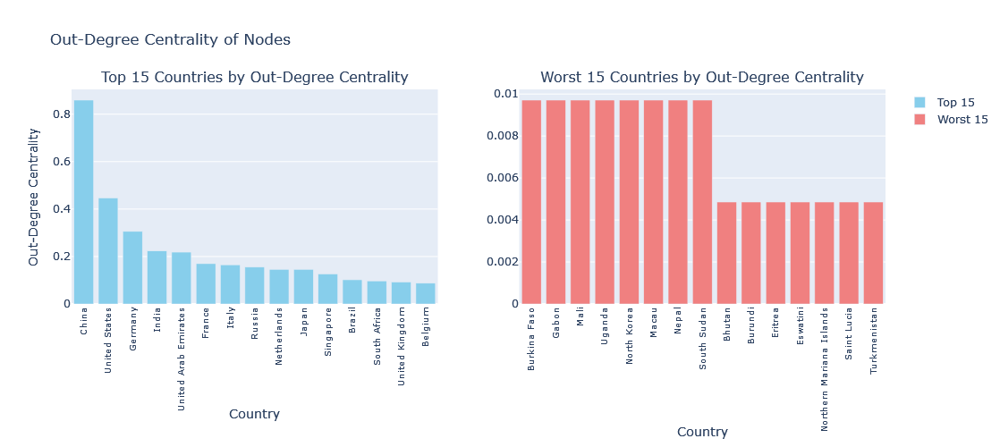

In [22]:
out_degree_centrality = nx.out_degree_centrality(G)
top_countries, worst_countries = histograms(out_degree_centrality, type='Out-Degree Centrality', n=15)

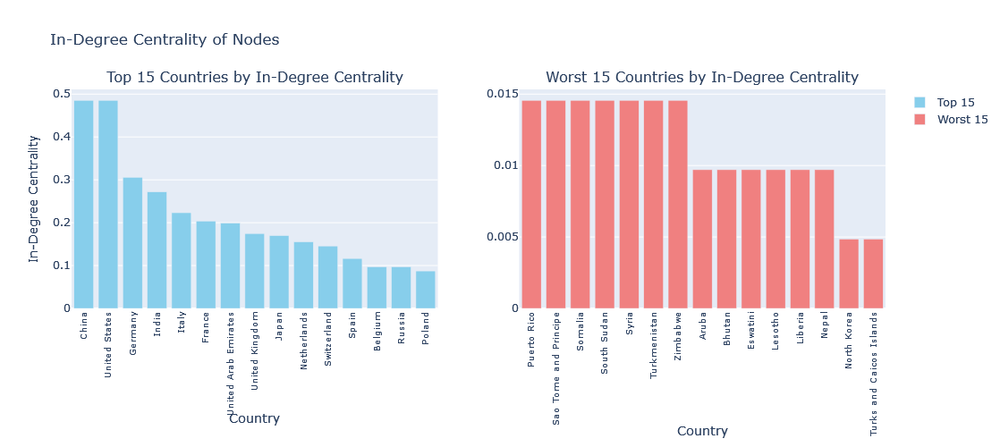

In [23]:
in_degree_centrality = nx.in_degree_centrality(G)
top_countries, worst_countries = histograms(in_degree_centrality, type='In-Degree Centrality', n=15)

In [24]:
def top_centrality_diff(cent1, cent2, type1, type2, typello, top_n=15, color1='skyblue', color2='orange'):
    
    diff = {country: cent1.get(country, 0) - cent2.get(country, 0) for country in set(cent1) | set(cent2)}

    sorted_diff_items = sorted(diff.items(), key=lambda item: abs(item[1]), reverse=True)
    
    top_diff_items = sorted_diff_items[:top_n]
    sorted_countries = [item[0] for item in top_diff_items][::-1] 
    #sorted_differential_values = [round(item[1], 3) for item in top_diff_items][::-1]  

    cent1_values = [round(cent1.get(country, 0), 3) for country in sorted_countries]
    cent2_values = [round(cent2.get(country, 0), 3) for country in sorted_countries]

    
    trace1 = go.Bar(
        y=sorted_countries, 
        x=cent1_values, 
        marker_color=color1,
        orientation='h', 
        name=type1,
        text=cent1_values,
        textposition='auto'
    )

    trace2 = go.Bar(
        y=sorted_countries,  
        x=cent2_values, 
        marker_color=color2,
        orientation='h', 
        name=type2,
        text=cent2_values,  
        textposition='auto'  
    )

    fig = go.Figure(data=[trace1, trace2])

    fig.update_layout(
        title=f'Top {top_n} Countries with Biggest Differential in {typello}',
        xaxis_title='Centrality Value',
        yaxis_title='Country',
        xaxis=dict(tickfont=dict(size=10)),  
        width=1000, 
        height=900,  
        barmode='group'  
    )

    fig.show()

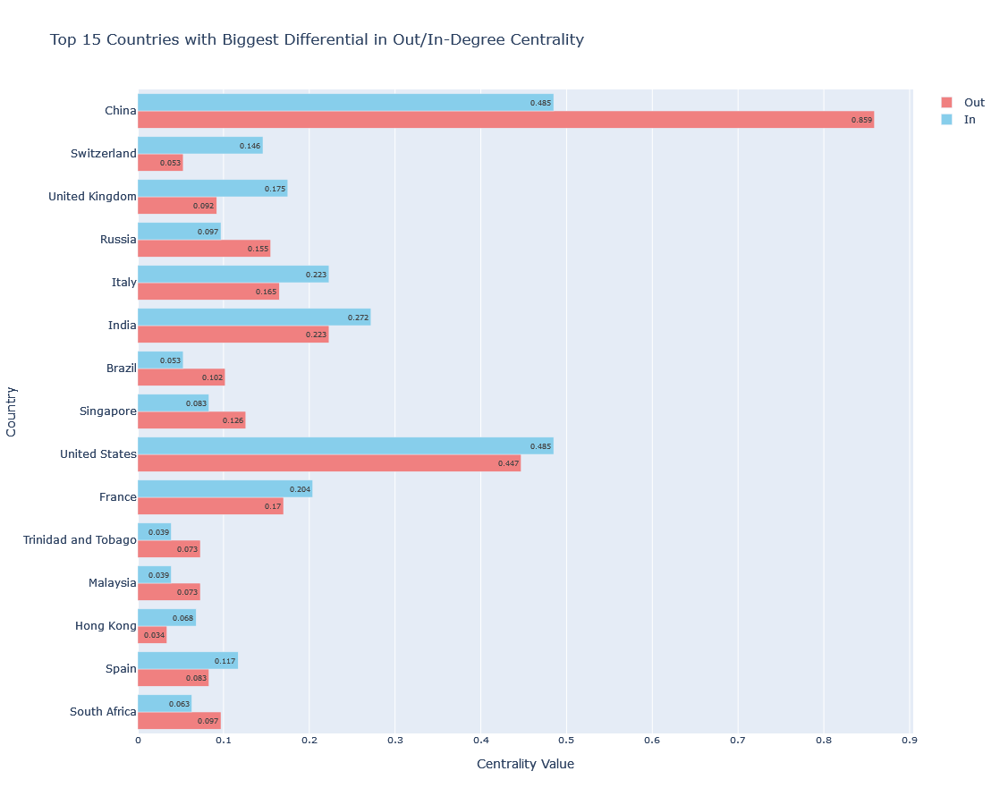

In [25]:
top_centrality_diff(out_degree_centrality, in_degree_centrality, typello='Out/In-Degree Centrality', type1='Out', type2='In', top_n=15, color1='lightcoral', color2='skyblue')

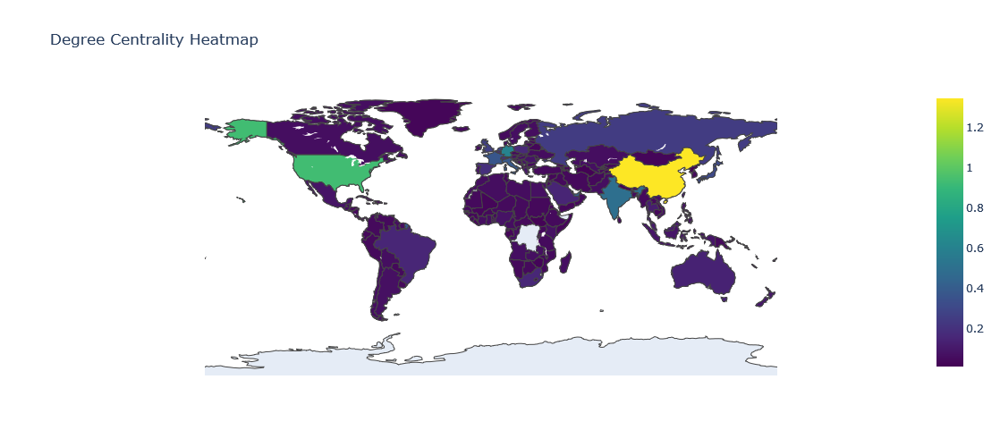

In [26]:
heatmap(degree_centrality, type='Degree Centrality')

The countries that showed 

### Degree Centrality Distribution

The degree centrality distribution is crucial for understanding the connectivity pattern within a trade network. Fitting this distribution to a power law can reveal whether the network has a scale-free structure, characterized by a few highly connected nodes (hubs) and many nodes with fewer connections. This is significant because it indicates the presence of dominant countries that act as major trade hubs, which can have substantial implications for network resilience, trade flow efficiency, and economic influence.

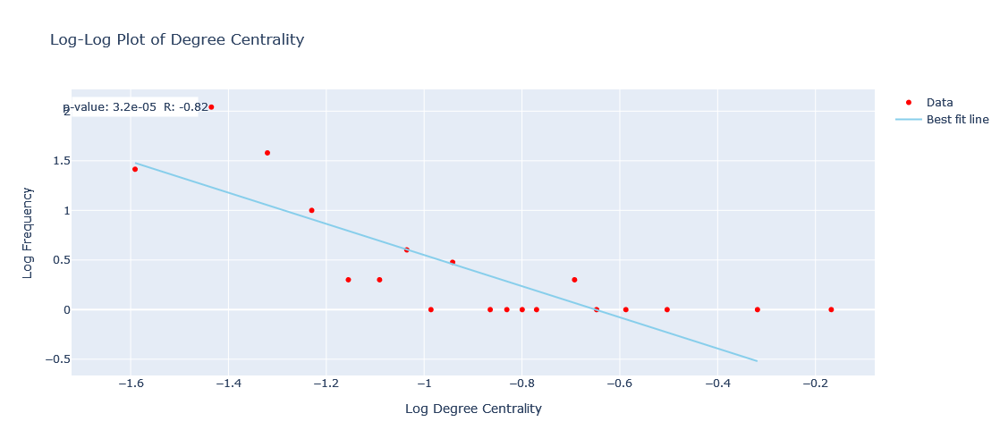

The slope of the line is: -1.5704400586045024


In [27]:
slope = plot_centrality_power_law(degree_centrality, bins=60, type='Degree', color='skyblue')

The negativity as well as the consistently high absolute value of the fitted line, suggests that just a few nodes of our network are highly connected, while the majority of them entertains commercial relationships with just a few countries.

### Cumulative Distribution for Degree Centrality

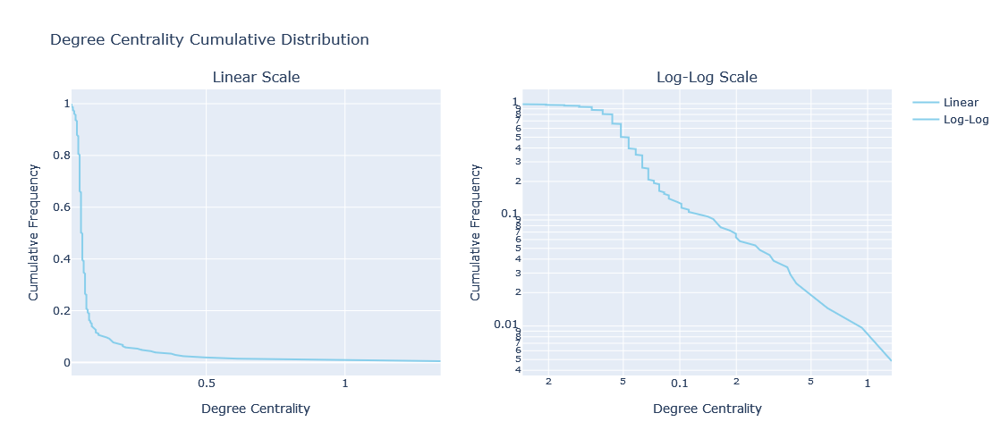

In [28]:
cumulative_distribution(degree_centrality,type='Degree', color='skyblue')

## Pagerank

PageRank is a measure of the importance of nodes in a network, taking into account both the quantity and quality of incoming links. In the context of trade, it indicates the overall importance of a country within the global trade network. A high PageRank score suggests that a country is a significant hub, attracting substantial trade from other countries.

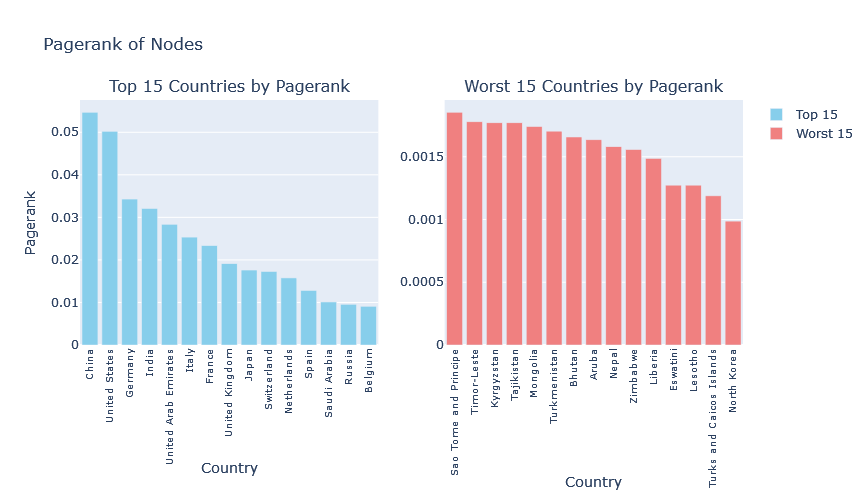

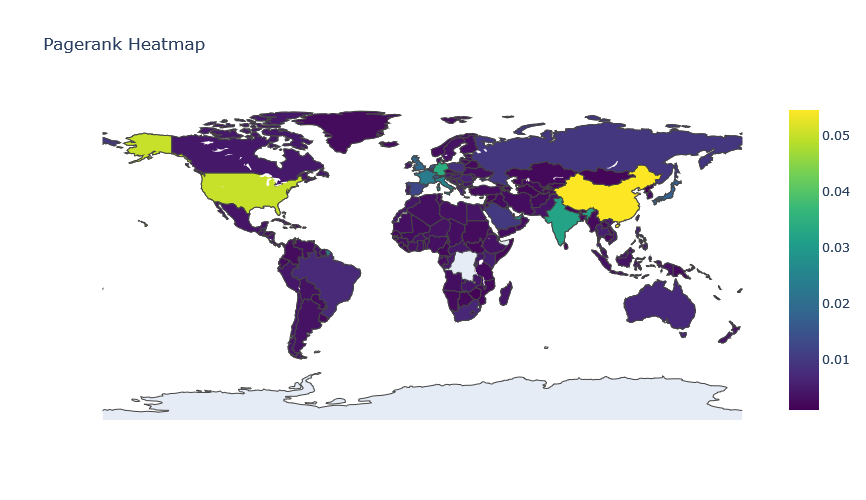

In [40]:
pagerank = nx.pagerank(G)

high_pagerank_nodes = histograms(pagerank, type='Pagerank', n=15, color='skyblue')
heatmap(pagerank, type='Pagerank')

### Pagerank Distribution

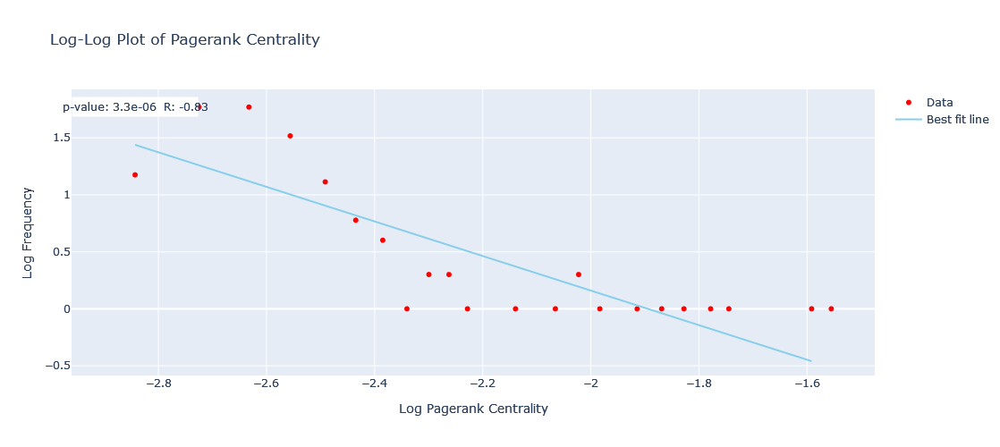

The slope of the line is: -1.5174047650560019


In [30]:
slope = plot_centrality_power_law(pagerank, bins=60, type='Pagerank', color='skyblue')

### Cumulative Distribution for Pagerank

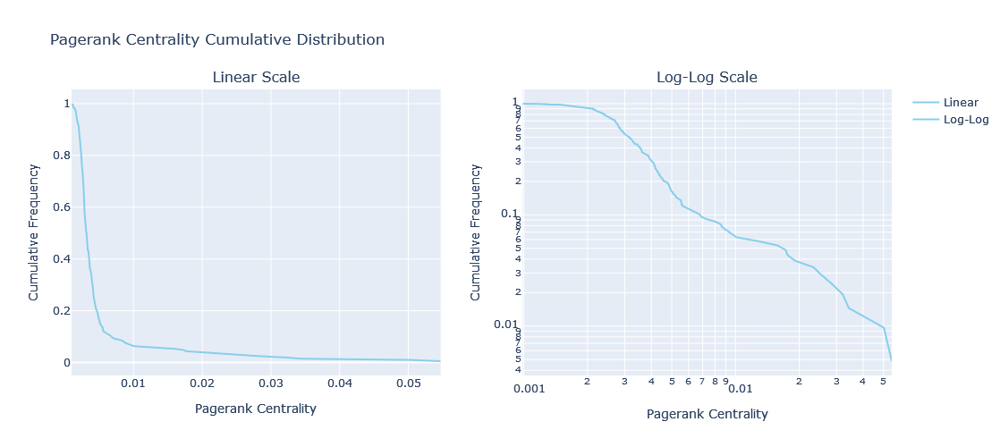

In [31]:
cumulative_distribution(pagerank,type='Pagerank', color='skyblue')

## Hyperlink-Induced Topic Search (HITS)

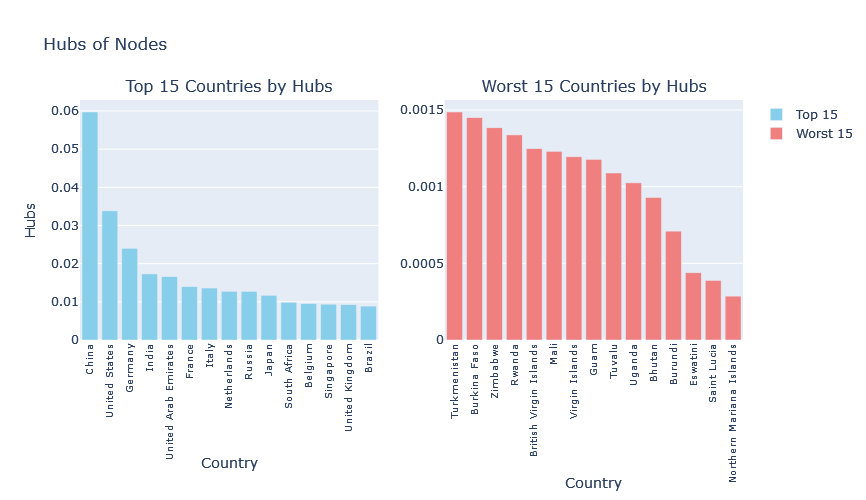

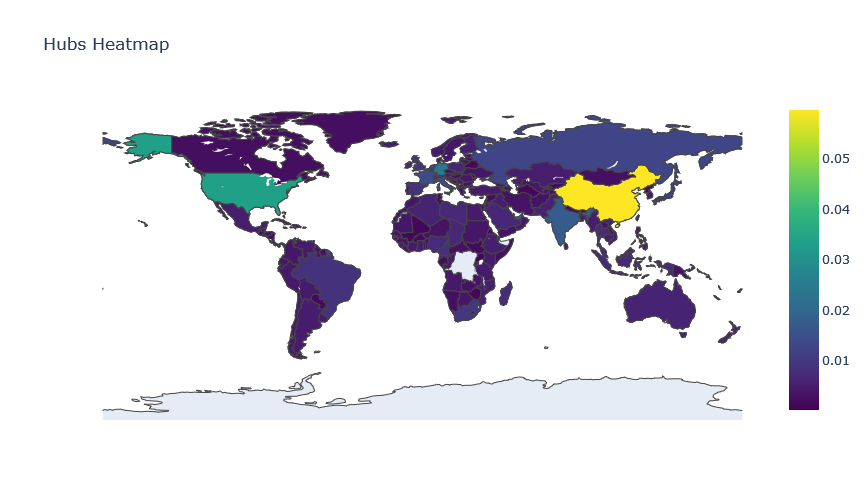

In [42]:
hubs, authorities = nx.hits(G)

nub_nodes = histograms(hubs, type='Hubs', n=15, color='skyblue')
heatmap(hubs, type='Hubs')

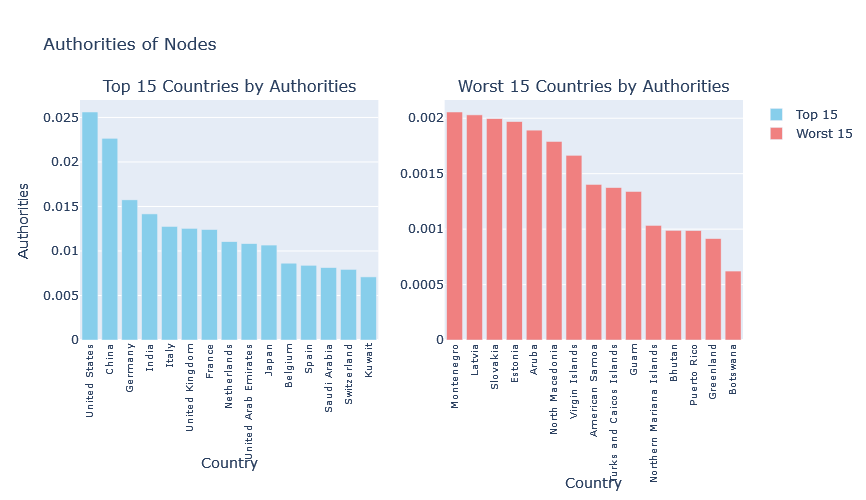

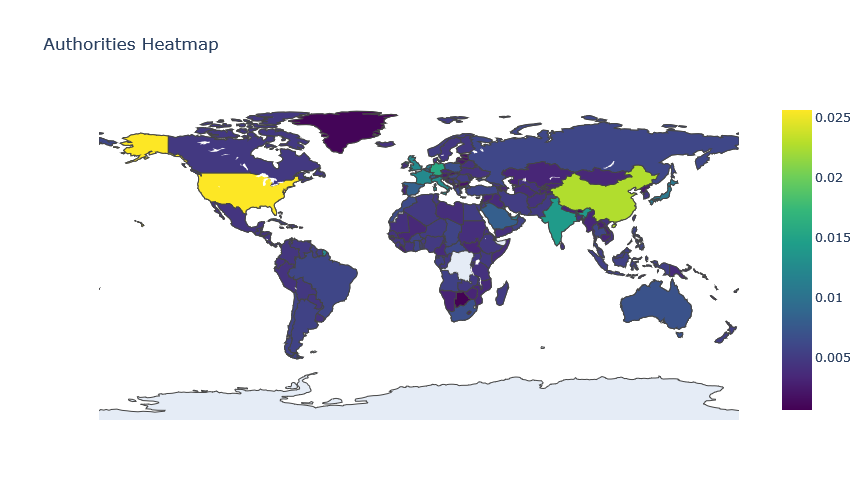

In [43]:
authority_nodes = histograms(authorities, type='Authorities', n=15, color='skyblue')
heatmap(authorities, type='Authorities')

## Closeness centrality

Closeness centrality measures how quickly a node can reach all other nodes in the network. In a trade network, it indicates how efficiently a country can access other countries' markets. A higher closeness centrality suggests that a country is geographically or economically well-positioned to trade with others, reducing trade costs and improving market access.

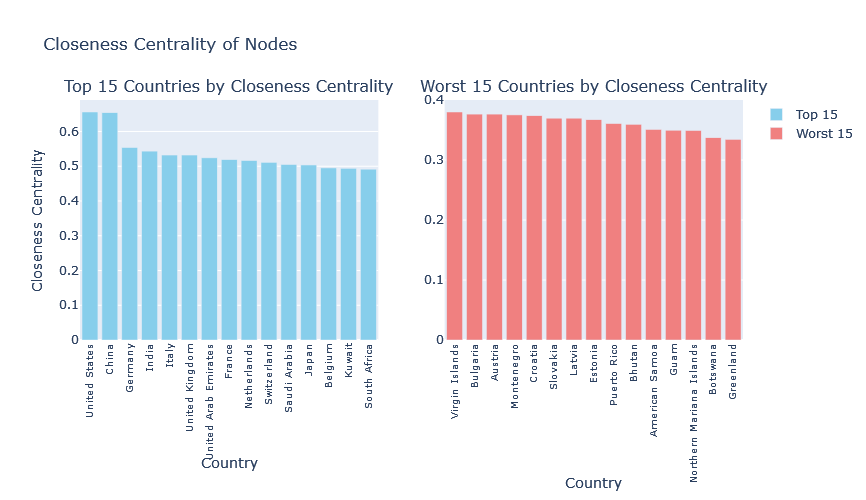

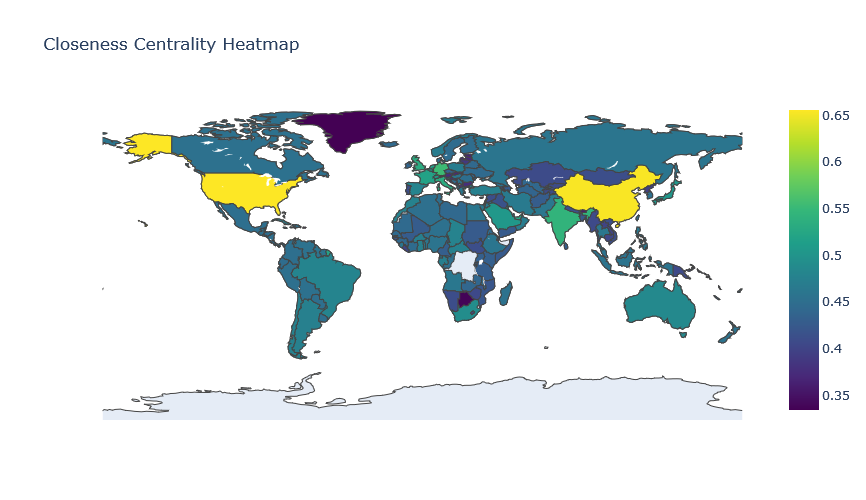

In [44]:
closeness_centrality = nx.closeness_centrality(G)

high_closeness_nodes = histograms(closeness_centrality, type='Closeness Centrality', n=15, color='skyblue')
heatmap(closeness_centrality, type='Closeness Centrality')

## Local Clustering coefficient

The clustering coefficient measures the degree to which nodes in a graph tend to cluster together. In trade networks, it indicates the extent to which countries tend to form trade blocs or regional trade agreements. A higher clustering coefficient suggests that countries tend to trade more with their neighbors, forming tightly-knit clusters.

In [50]:
print(data['Uruguay'])

{'Coordinates': {'lat': -33.0, 'lon': -56.0}, 'Government type': 'Presidential Republic', 'GDP': '$83.607 billion', 'GDP% Exports': '21.6', 'GDP% Imports': '-18.4', 'Exports $': '$22.565 billion', 'Export Partners': {'China': '29', 'Brazil': '12', 'United States': '5', 'Netherlands': '5', 'Argentina': '5'}, 'Export Commodities': 'sulfate wood pulp, beef, soybeans, concentrated milk, rice', 'Imports $': '$18.894 billion', 'Import Partners': {'Brazil': '25', 'China': '15', 'United States': '11', 'Argentina': '11'}, 'Import Commodities': 'crude petroleum, packaged medicines, cars, broadcasting equipment, delivery trucks'}


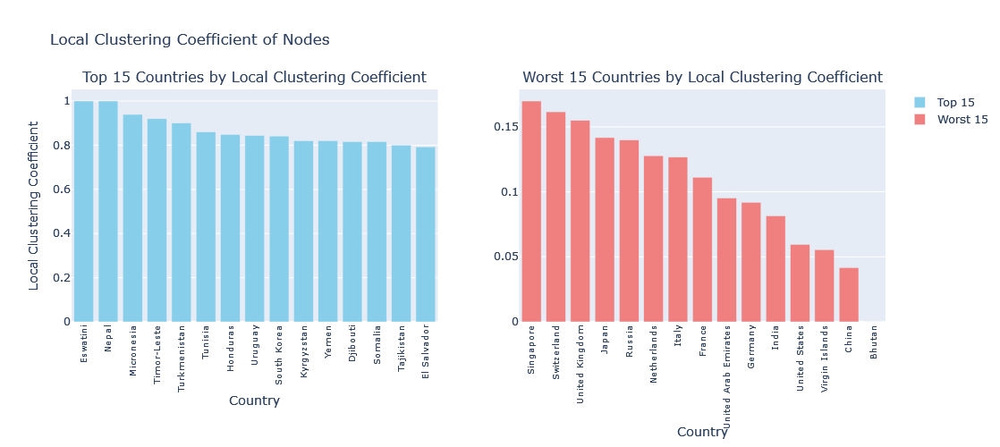

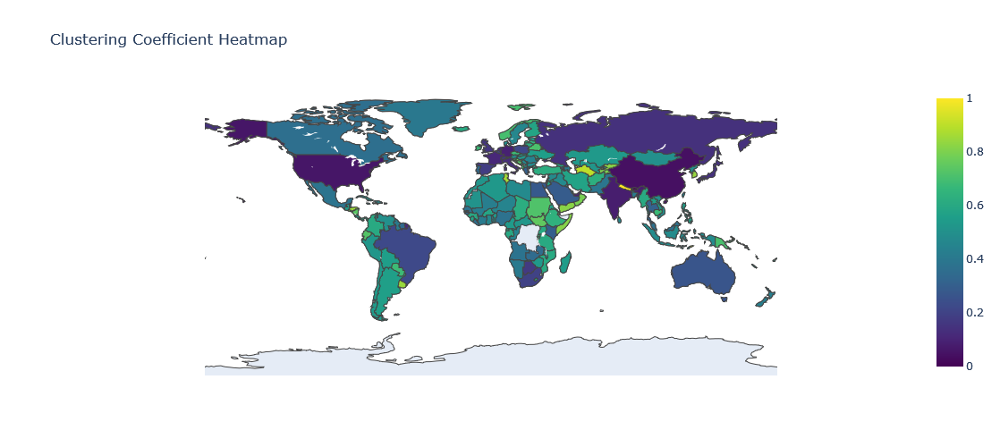

In [51]:
clustering_coeffs = nx.clustering(G)

high_clustering_nodes = histograms(clustering_coeffs, type='Local Clustering Coefficient', n=15, color='skyblue')
heatmap(clustering_coeffs, type='Clustering Coefficient')

### Correlation between Local Clustering Coefficient and Degree Centrality

Is a measure of how these two properties are related across the nodes of a graph. Degree centrality measures the number of connections a node has, while the local clustering coefficient measures the tendency of a node's neighbors to be connected with each other. By examining their correlation, we can gain insights into the structural properties of the graph.

Key Metrics:

-Local Clustering Coefficient (LCC): Indicates how likely a country's trade partners are to trade with each other.

-Degree Centrality (DC): Represents the number of direct trade connections a country has.

Pearson correlation coefficient: -0.5127
P-value: 2.8277e-15


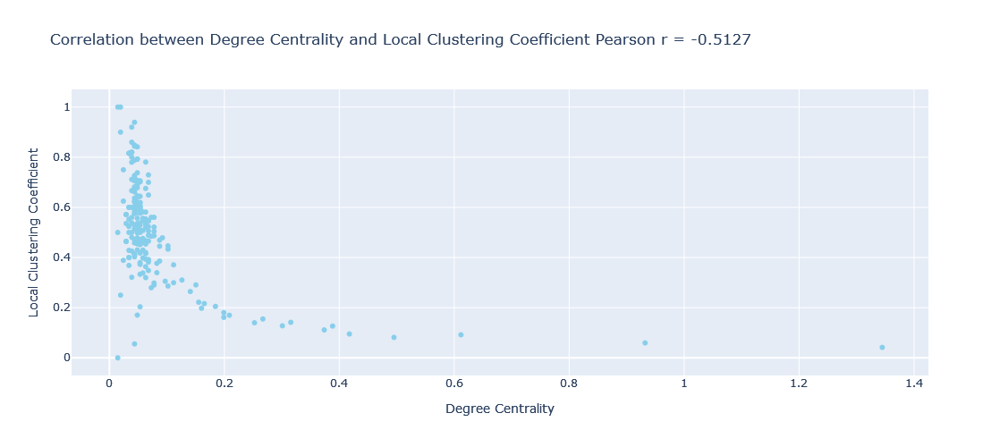

In [52]:
correlation, p_value = correlation_cd(clustering_coeffs, degree_centrality, color='skyblue')

## Small-World Effect

In [53]:
clustering_coefficient = nx.average_clustering(G)
print(f"Average Clustering Coefficient: {clustering_coefficient:.4f}")
avg_shortest_path_length = avg_shortestpath(G)

Average Clustering Coefficient: 0.5027
Average Shortest Path Length: 2.2729


In [54]:
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
random_graph = nx.gnm_random_graph(num_nodes, num_edges, directed=True)

random_clustering_coefficient = nx.average_clustering(random_graph)
print(f"Random Graph Average Clustering Coefficient: {random_clustering_coefficient:.4f}")
random_avg_shortest_path_length = avg_shortestpath(random_graph)

Random Graph Average Clustering Coefficient: 0.0411
Average Shortest Path Length: 2.7213


In [55]:
print(f"Clustering Coefficient (G): {clustering_coefficient:.4f} vs. Random Graph: {random_clustering_coefficient:.4f}")
print(f"Average Shortest Path Length (G): {avg_shortest_path_length:.4f} vs. Random Graph: {random_avg_shortest_path_length:.4f}")

Clustering Coefficient (G): 0.5027 vs. Random Graph: 0.0411
Average Shortest Path Length (G): 2.2729 vs. Random Graph: 2.7213


## K-core and core periphery structures

K-core decomposition is used to identify subgraphs within the network that are more densely connected. The k-core of a graph is a maximal subgraph in which each node has at least degree k. By analyzing k-cores, we can identify the most influential and interconnected nodes within the trade network. These core nodes are crucial for understanding the backbone of the trade network, as they often represent countries with strong and diverse trade relationships.

In [59]:
core, highest_core = kcores(G, 3, 20)


Nodes in the 3-core (207 elements): ['Afghanistan', 'Albania', 'Algeria', 'American Samoa', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada', 'Cayman Islands', 'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao', 'Cyprus', 'Czechia', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'French Polynesia', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Greenland', 'Grenada', 'Guam', 'Guatemala', 'Gu

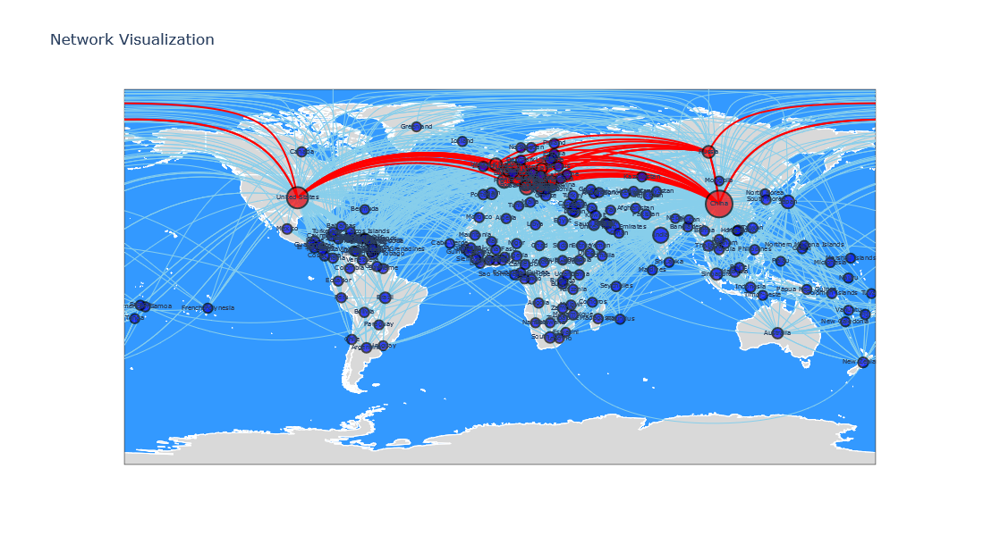

In [60]:
plot_network_on_world_map(G, degree_centrality, cliques=highest_core)

## Assortative mixing by degree

Assortative mixing by degree measures the tendency of nodes to connect to other nodes that are similar in degree. In the context of trade networks, this can indicate whether countries with similar trade volumes tend to trade with each other. High assortative mixing suggests that countries with high trade volumes (high-degree nodes) tend to trade more with other high-volume countries, while low assortative mixing might indicate a more diverse set of trade partners irrespective of trade volume.

In [61]:
assortativity_coefficient = nx.degree_assortativity_coefficient(G)

print(f"Assortative Mixing by Degree: {assortativity_coefficient:.4f}")

Assortative Mixing by Degree: -0.2991


### Visualize the degree correlations

Degree correlation measures the relationship between a node's degree and the average degree of its neighbors. This can help in understanding how nodes are connected within the network. In trade networks, it helps to analyze whether countries with many trade connections (high-degree nodes) tend to be connected to other well-connected countries or to less connected countries. This information can reveal the structural properties of the trade network, such as the presence of hubs or clusters.

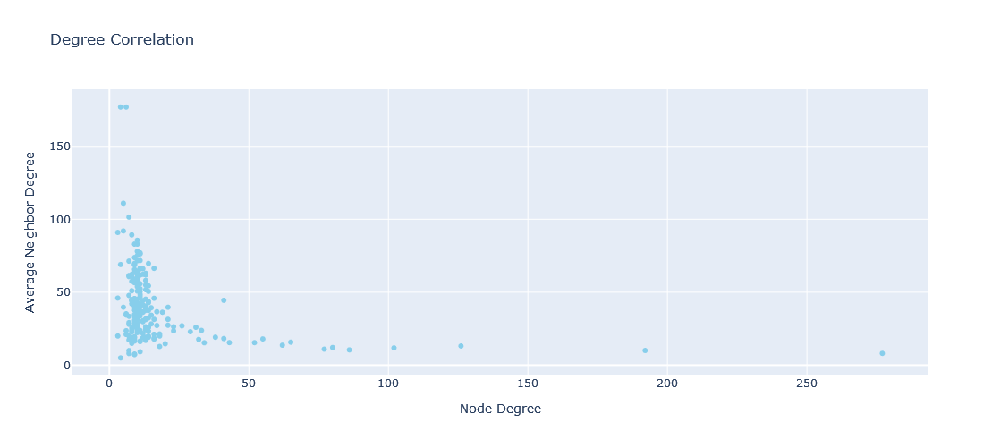

In [62]:
deg_cor(G)

## Density

Graph density is a measure of how many edges are present in the graph compared to the maximum possible number of edges. It gives a sense of how "dense" or "sparse" the network is. In the context of trade networks, density indicates the overall connectivity among countries. A denser network suggests that there are more trade relationships between countries, indicating a more interconnected and potentially robust global trade system.

In [63]:
graph_density = nx.density(G)

print(f"Graph Density: {graph_density:.4f}")

Graph Density: 0.0413


# Attributes Analysis and Comparisons

In [64]:
# Extracting data for histograms
gdp_data = extract_node_attributes(G, 'GDP')
exports_dollars_data = extract_node_attributes(G, 'Exports $')
imports_dollars_data = extract_node_attributes(G, 'Imports $')
exports_gdp_percentage_data = extract_node_attributes(G, 'Exports GDP%')
imports_gdp_percentage_data = extract_node_attributes(G, 'Imports GDP%')

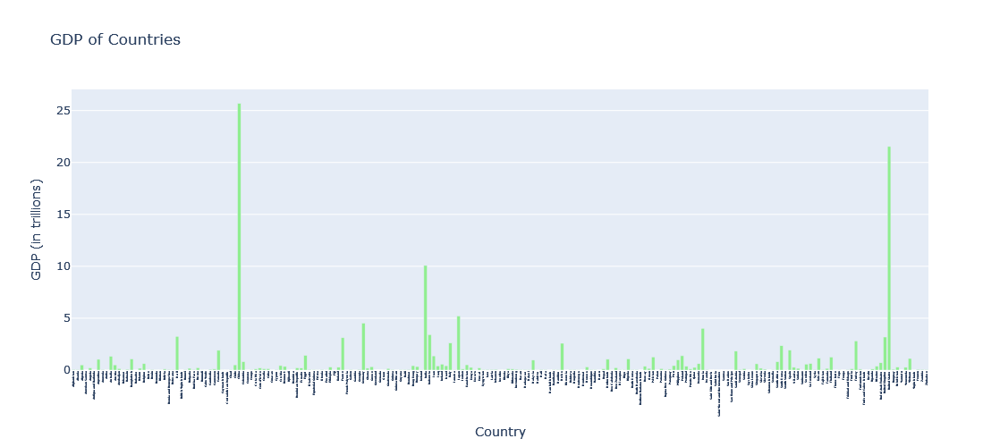

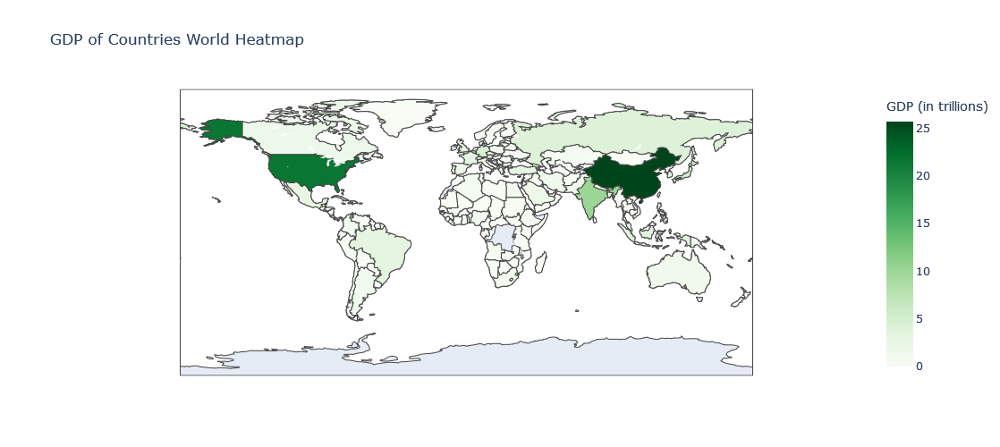

In [66]:
plot_attributes(gdp_data, 'GDP of Countries', 'Country', 'GDP (in trillions)', 'lightgreen','greens')

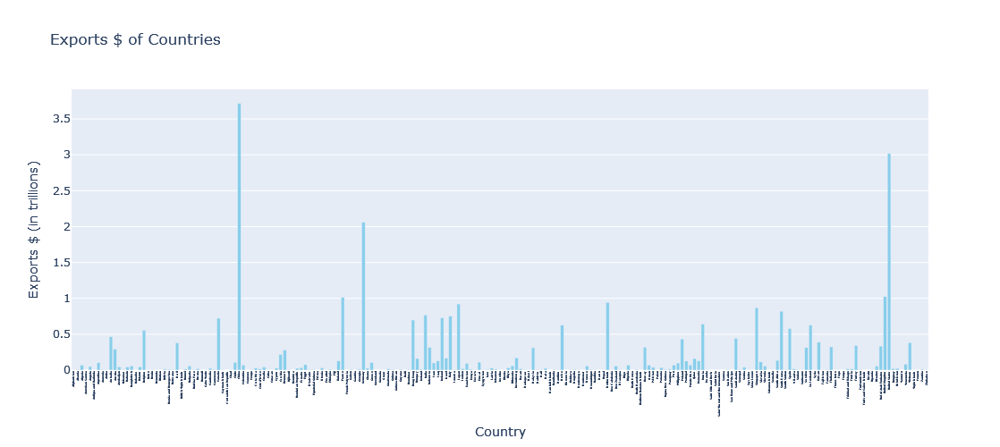

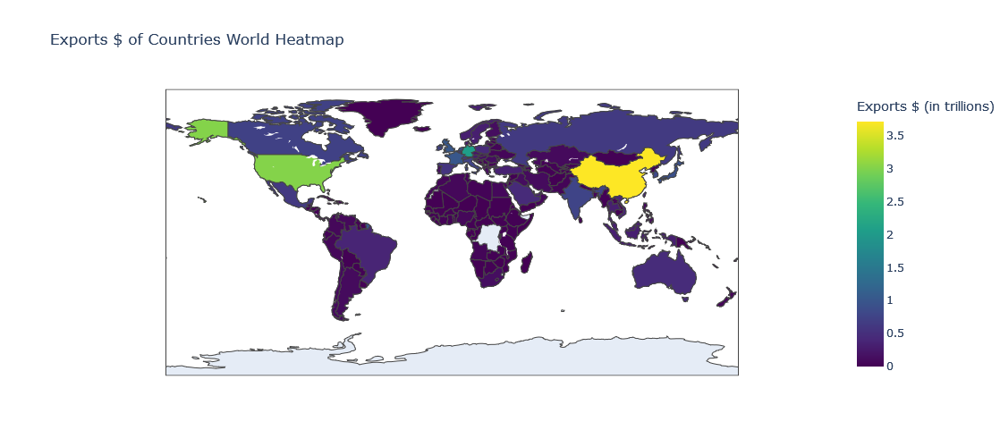

In [67]:
plot_attributes(exports_dollars_data, 'Exports $ of Countries', 'Country', 'Exports $ (in trillions)')

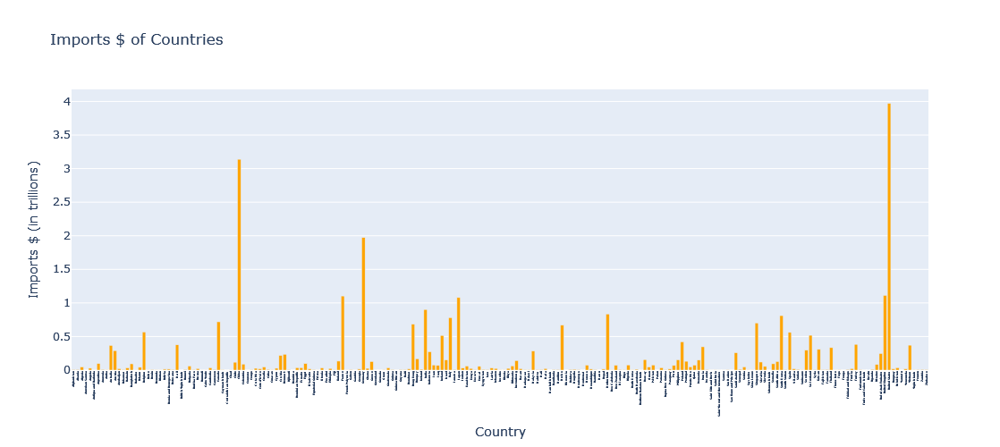

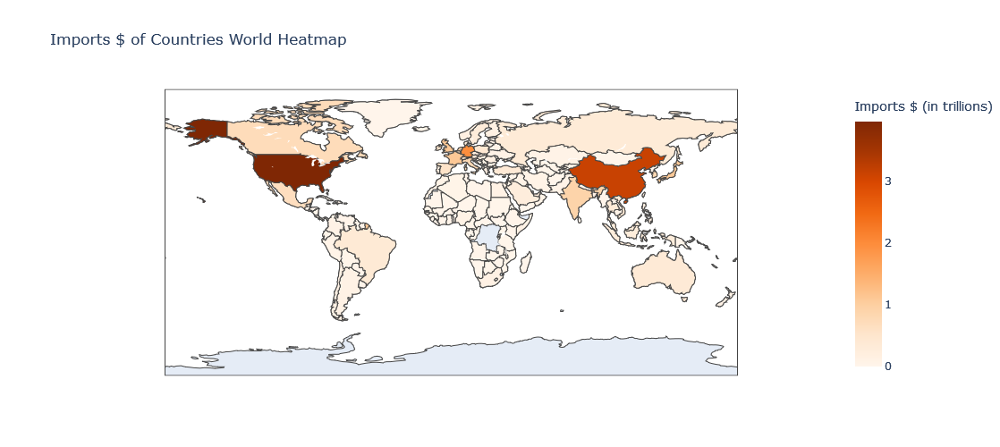

In [68]:
plot_attributes(imports_dollars_data, 'Imports $ of Countries', 'Country', 'Imports $ (in trillions)', 'orange', 'oranges')

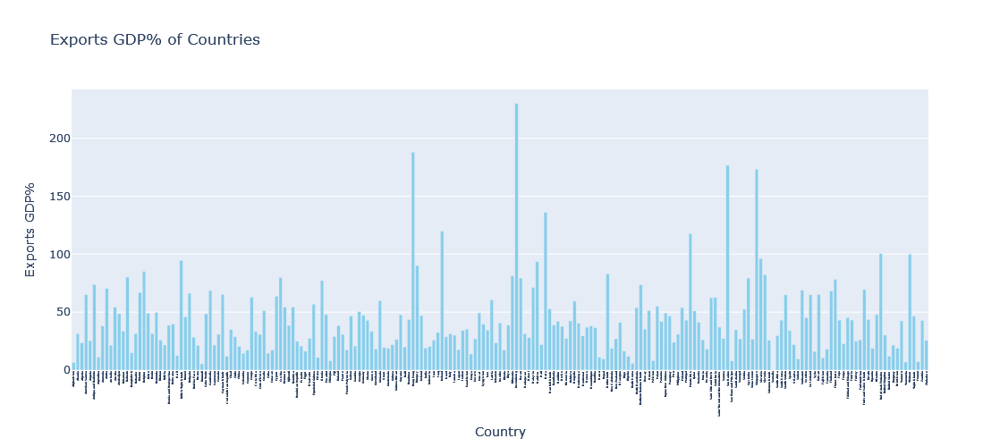

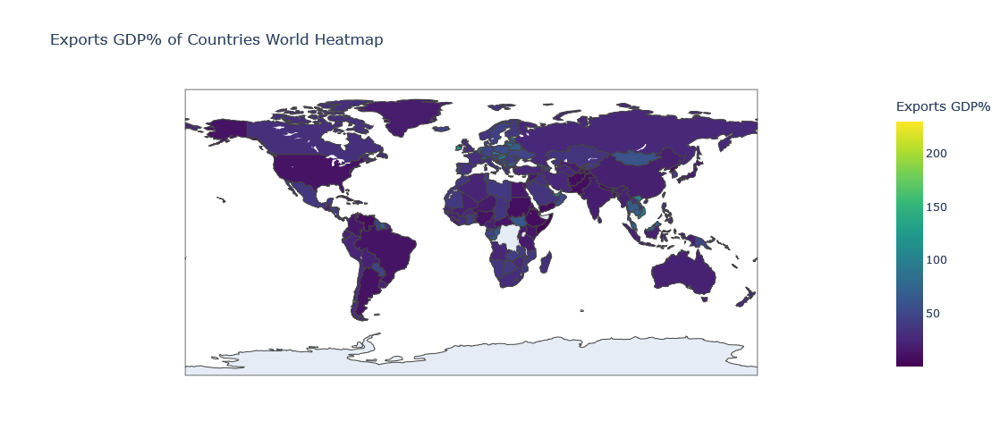

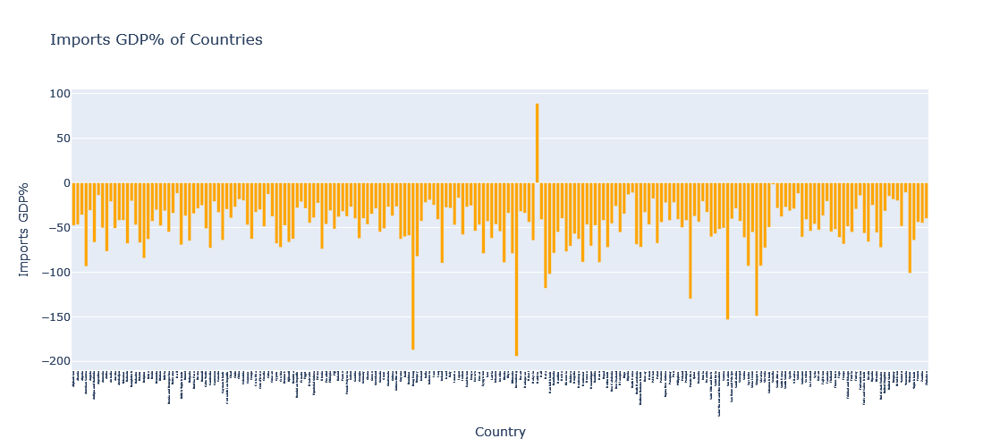

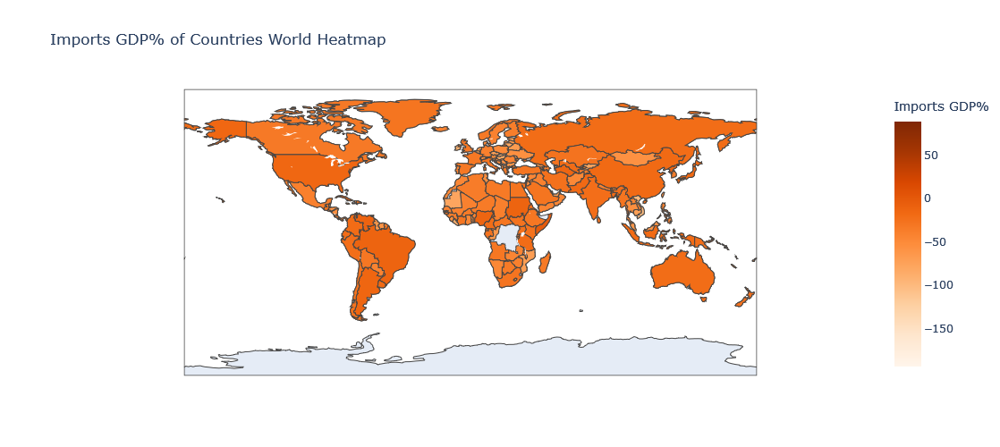

In [69]:
exports_gdp_percentage_data = {k: float(v) for k, v in exports_gdp_percentage_data.items()}
imports_gdp_percentage_data = {k: float(v) for k, v in imports_gdp_percentage_data.items()}
plot_attributes(exports_gdp_percentage_data, 'Exports GDP% of Countries', 'Country', 'Exports GDP%', 'skyblue')
plot_attributes(imports_gdp_percentage_data, 'Imports GDP% of Countries', 'Country', 'Imports GDP%', 'orange', 'oranges')

## Commodities

In [80]:
commodity_counts_export, commodity_counts_import = analyze_commodities(node_attributes)
print(commodity_counts_export.most_common(20))

[('refined petroleum', 80), ('gold', 65), ('crude petroleum', 46), ('natural gas', 36), ('packaged medicines', 30), ('lumber', 22), ('copper', 18), ('cars and vehicle parts', 18), ('integrated circuits', 18), ('insulated wiring', 17), ('diamonds', 15), ('broadcasting equipment', 15), ('scrap iron', 14), ('iron alloys', 13), ('ships', 13), ('cars', 13), ('tuna', 13), ('clothing and apparel', 13), ('electricity', 11), ('fertilizers', 11)]


In [81]:
print(commodity_counts_import.most_common(20))

[('refined petroleum', 161), ('cars', 118), ('packaged medicines', 81), ('broadcasting equipment', 70), ('crude petroleum', 53), ('natural gas', 36), ('delivery trucks', 30), ('rice', 27), ('aircraft', 22), ('gold', 19), ('cars and vehicle parts', 19), ('ships', 18), ('jewelry', 15), ('wheat', 14), ('electricity', 13), ('integrated circuits', 13), ('clothing and apparel', 13), ('recreational boats', 10), ('iron', 10), ('palm oil', 9)]


### Common Commodities Between Countries and Commodity Frequency

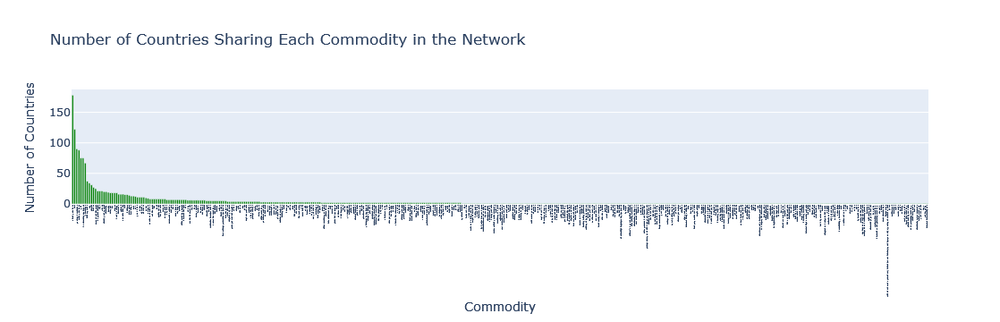

Commodity 'wheat flours' is shared by countries: Afghanistan, Saint Vincent and the Grenadines, Lesotho, Syria
Commodity 'cotton' is shared by countries: Afghanistan, Greece, Azerbaijan, Bangladesh, Benin, Togo, Burkina Faso, Mali, Sudan, Tajikistan
Commodity 'gold' is shared by countries: Afghanistan, United Arab Emirates, India, China, Uzbekistan, Turkey, United Kingdom, Australia, Ghana, Fiji, Singapore, South Africa, Suriname, Argentina, Armenia, Switzerland, Iraq, Malaysia, Jordan, Venezuela, Thailand, Azerbaijan, Bahrain, Saudi Arabia, Guyana, Benin, Canada, Bolivia, Peru, Colombia, Botswana, Hong Kong, Namibia, Burkina Faso, Burundi, Tanzania, Zambia, Cambodia, Cameroon, Cayman Islands, Central African Republic, Chad, Madagascar, Rwanda, Libya, Egypt, Dominican Republic, Honduras, Nicaragua, Eritrea, Eswatini, Ethiopia, Mali, Senegal, Guinea, Kazakhstan, Uganda, Kyrgyzstan, Laos, Lebanon, Liberia, Malawi, Mauritania, Mongolia, Mozambique, Niger, Oman, Papua New Guinea, Solomon I

In [121]:
commodity_to_countries, commodity_to_countries_export, commodity_to_countries_import = find_countries_with_common_commodities(G)

plot_common_commodities_histogram(commodity_to_countries, color='green')
print_common_commodities(commodity_to_countries)

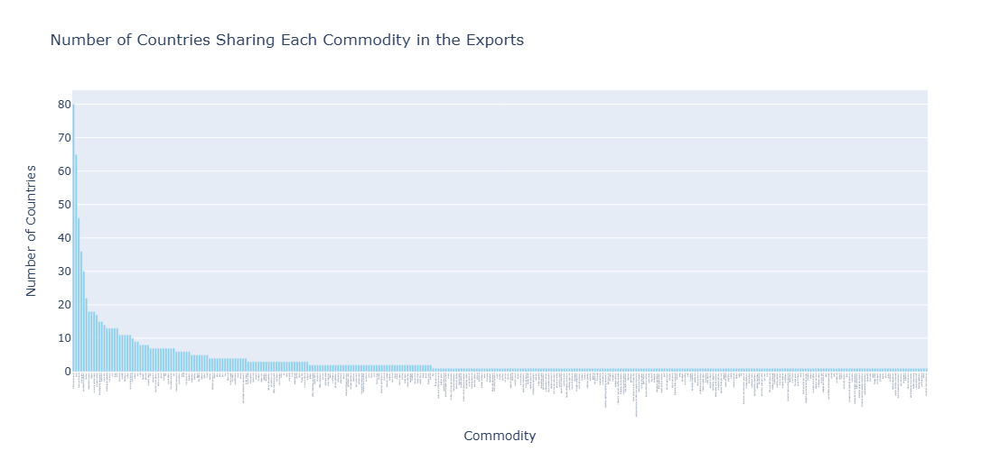

Commodity 'gold' is shared by countries: Afghanistan, United Arab Emirates, Uzbekistan, United Kingdom, Australia, Ghana, Fiji, Singapore, South Africa, Suriname, Argentina, Armenia, Switzerland, Iraq, Venezuela, Azerbaijan, Guyana, Benin, Canada, Bolivia, Peru, Colombia, Botswana, Hong Kong, Namibia, Burkina Faso, Burundi, Tanzania, Zambia, Cameroon, Cayman Islands, Central African Republic, Chad, Madagascar, Rwanda, Libya, Egypt, Dominican Republic, Honduras, Nicaragua, Eritrea, Eswatini, Ethiopia, Mali, Senegal, Guinea, Kazakhstan, Uganda, Kyrgyzstan, Laos, Lebanon, Liberia, Malawi, Mauritania, Mongolia, Mozambique, Niger, Papua New Guinea, Solomon Islands, Somalia, South Sudan, Sudan, Tajikistan, Yemen, Zimbabwe
Commodity 'grapes' is shared by countries: Afghanistan, Lebanon
Commodity 'cotton' is shared by countries: Afghanistan, Greece, Azerbaijan, Benin, Togo, Burkina Faso, Mali, Sudan, Tajikistan
Commodity 'coal' is shared by countries: Afghanistan, Australia, Indonesia, South A

In [123]:
plot_common_commodities_histogram(commodity_to_countries_export, name='Exports')
print_common_commodities(commodity_to_countries_export)

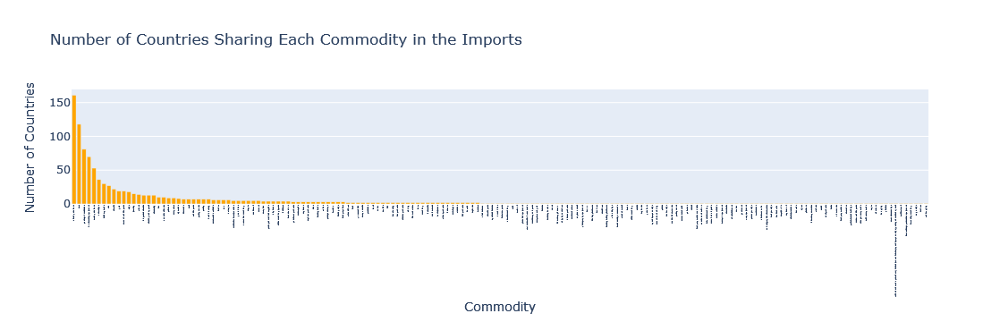

Commodity 'wheat flours' is shared by countries: Afghanistan, Syria
Commodity 'broadcasting equipment' is shared by countries: Afghanistan, United Arab Emirates, Germany, United States, Australia, Burma, Fiji, New Zealand, Kenya, South Africa, Poland, Chile, Armenia, Russia, Iraq, Netherlands, Iran, Jordan, Japan, Austria, Czechia, Israel, Bahrain, Saudi Arabia, Belarus, Ukraine, Togo, Luxembourg, Peru, Colombia, Hong Kong, Romania, Central African Republic, Chad, Rwanda, Costa Rica, Hungary, Libya, Slovakia, Denmark, Sweden, Norway, El Salvador, Honduras, Estonia, Finland, Latvia, Lithuania, Tonga, French Polynesia, Mali, Guam, Philippines, Kazakhstan, Kuwait, Kyrgyzstan, Maldives, Micronesia, Moldova, Montserrat, Nepal, Oman, Palau, Paraguay, Qatar, Somalia, Syria, Turkmenistan, Uruguay, Vanuatu
Commodity 'refined petroleum' is shared by countries: Afghanistan, United Arab Emirates, Pakistan, Uzbekistan, Albania, Italy, Spain, Greece, France, Turkey, Algeria, South Korea, Australia, 

In [125]:
plot_common_commodities_histogram(commodity_to_countries_import, name='Imports', color='orange')
print_common_commodities(commodity_to_countries_import)

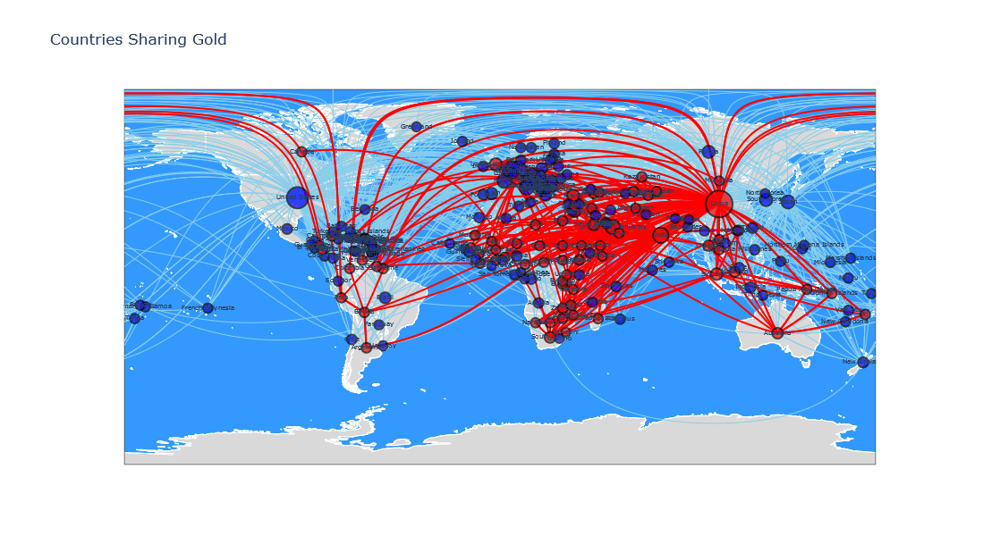

In [127]:
plot_commodity_on_world_map(G, degree_centrality, 'gold', title='Countries Sharing Gold')